In [1]:
from xenonnt_plot_style import XENONPlotStyle as xps
xps.use('xenonnt')

import numpy as np
import appletree as apt
from applefiles import aptext
import matplotlib.pyplot as plt
import pandas as pd
import scipy.stats as sps

import jax.numpy as jnp
import multihist as mh
from matplotlib.colors import LogNorm

from tqdm import tqdm
from appletree.utils import load_json, get_file_path
from GOFevaluation import BinnedPoissonChi2GOF, ADTestTwoSampleGOF

XLA_PYTHON_CLIENT_PREALLOCATE is set to false
XLA_PYTHON_CLIENT_ALLOCATOR is set to platform
Using aptext package from https://github.com/XENONnT/applefiles


In [2]:
apt.set_gpu_memory_usage(0.2)

In [3]:
apt.clear_cache()
filename = '/home/ykaminaga/gamma_apt/sr1_rn220_fitting.h5'
context = apt.Context.from_backend(filename)
component = context.likelihoods['rn220_llh'].components['rn220_er']

OSError: [Errno 5] Input/output error

In [4]:
component.show_config()

,option,default,current,applies_to,help
0,s1_bias_3f,_s1_bias.json,/home/ykaminaga/appletree/applefiles/files/s1_...,[s1_area],3fold S1 reconstruction bias
1,s1_smear_3f,_s1_smearing.json,/home/ykaminaga/appletree/applefiles/files/s1_...,[s1_area],3fold S1 reconstruction smearing
2,s1_correction,_s1_correction.json,/home/ykaminaga/appletree/applefiles/files/s1_...,[s1_correction],S1 xyz correction on reconstructed positions
3,s1_lce,_s1_correction.json,/home/ykaminaga/appletree/applefiles/files/s1_...,[s1_lce],S1 light collection efficiency
4,lower_energy,0.01,0.01,[energy],Energy lower limit simulated in uniformly dist...
5,upper_energy,20.0,20.0,[energy],Energy upper limit simulated in uniformly dist...
6,z_min,-133.97,-133.97,"[x, y, z]",Z lower limit simulated in uniformly distribution
7,z_max,-13.35,-13.35,"[x, y, z]",Z upper limit simulated in uniformly distribution
8,r_max,60.0,60.0,"[x, y, z]",Radius upper limit simulated in uniformly dist...
9,posrec_reso,_posrec_reso.json,/home/ykaminaga/appletree/applefiles/files/pos...,"[rec_x, rec_y, rec_z, rec_r]",Position reconstruction resolution


In [8]:
import h5py
with h5py.File(filename, "r") as opt:
    print(opt["mcmc"].attrs["config"])

{
    "elife": "elife_bkg_sr1.json",
    "event_building_eff": "anti_correlation_eff_rn220_sr1.json",
    "posrec_reso": "posrec_reso_sr0.json",
    "s1_bias_3f": "3fold_s1_bias_rn220_sr1.json",
    "s1_correction": "s1_correction_sr1.json",
    "s1_cut_acc": [
        "s1_cut_acc_median_rn220_sr1.json",
        "s1_cut_acc_lower_rn220_sr1.json",
        "s1_cut_acc_upper_rn220_sr1.json"
    ],
    "s1_eff_n_hits_3f": [
        "3fold_recon_eff_n_hits_median_sr0.json",
        "3fold_recon_eff_n_hits_lower_sr0.json",
        "3fold_recon_eff_n_hits_upper_sr0.json"
    ],
    "s1_lce": "s1_correction_sr1.json",
    "s1_smear_3f": "3fold_s1_smearing_rn220_sr1.json",
    "s2_bias": "s2_bias_rn220_sr1.json",
    "s2_correction": "s2_correction_sr1.json",
    "s2_cut_acc": [
        "s2_cut_acc_median_rn220_sr1.json",
        "s2_cut_acc_lower_rn220_sr1.json",
        "s2_cut_acc_upper_rn220_sr1.json"
    ],
    "s2_lce": "s2_correction_sr1.json",
    "s2_smear": "s2_smearing_rn220_sr1.json

In [4]:
context.config

{'elife': 'elife_bkg_sr1.json',
 'event_building_eff': 'anti_correlation_eff_rn220_sr1.json',
 'posrec_reso': 'posrec_reso_sr0.json',
 's1_bias_3f': '3fold_s1_bias_rn220_sr1.json',
 's1_correction': 's1_correction_sr1.json',
 's1_cut_acc': ['s1_cut_acc_median_rn220_sr1.json',
  's1_cut_acc_lower_rn220_sr1.json',
  's1_cut_acc_upper_rn220_sr1.json'],
 's1_eff_n_hits_3f': ['3fold_recon_eff_n_hits_median_sr0.json',
  '3fold_recon_eff_n_hits_lower_sr0.json',
  '3fold_recon_eff_n_hits_upper_sr0.json'],
 's1_lce': 's1_correction_sr1.json',
 's1_smear_3f': '3fold_s1_smearing_rn220_sr1.json',
 's2_bias': 's2_bias_rn220_sr1.json',
 's2_correction': 's2_correction_sr1.json',
 's2_cut_acc': ['s2_cut_acc_median_rn220_sr1.json',
  's2_cut_acc_lower_rn220_sr1.json',
  's2_cut_acc_upper_rn220_sr1.json'],
 's2_lce': 's2_correction_sr1.json',
 's2_smear': 's2_smearing_rn220_sr1.json'}

In [5]:
print(component.code)

from functools import partial
from jax import jit
from appletree.plugins import PositionSpectra
from appletree.plugins import UniformEnergySpectra
from appletree.plugins import RecombFluct
from appletree.plugins import mTI
from appletree.plugins import Quanta
from appletree.plugins import TrueRecombER
from appletree.plugins import IonizationER
from appletree.plugins import DriftLoss
from appletree.plugins import RecombinationER
from appletree.plugins import S2LCE
from appletree.plugins import ElectronDrifted
from appletree.plugins import S2PE
from appletree.plugins import S1LCE
from appletree.plugins import PhotonDetection
from appletree.plugins import S1PE
from appletree.plugins import S2
from appletree.plugins import S1
from appletree.plugins import S1NHits
from appletree.plugins import PositionRecon
from appletree.plugins import AntiCorrelationEfficiency
from appletree.plugins import FiducialVolumeCylinderAccept
from appletree.plugins import S2CutAccept
from appletree.plugins import

In [6]:
from appletree.share import _cached_configs, _cached_functions
_cached_configs

{
    "anti_correlation_eff": "/home/ykaminaga/appletree/applefiles/files/fake_maps/_anti_correlation_eff.json",
    "elife": "/home/ykaminaga/appletree/applefiles/files/electron_lifetime/elife_bkg_sr1.json",
    "event_building_eff": "/home/ykaminaga/appletree/applefiles/files/rn220_ambience/anti_correlation_eff_rn220_sr1.json",
    "gas_gain_relative": "/home/ykaminaga/.local/lib/python3.11/site-packages/appletree/maps/_gas_gain_relative.json",
    "lower_energy": 0.01,
    "posrec_reso": "/home/ykaminaga/appletree/applefiles/files/posrec/posrec_reso_sr0.json",
    "r_max": 60.0,
    "s1_bias_3f": "/home/ykaminaga/appletree/applefiles/files/s1_bias/3fold_s1_bias_rn220_sr1.json",
    "s1_correction": "/home/ykaminaga/appletree/applefiles/files/s1_xyz/s1_correction_sr1.json",
    "s1_cut_acc": [
        "s1_cut_acc_median_rn220_sr1.json",
        "s1_cut_acc_lower_rn220_sr1.json",
        "s1_cut_acc_upper_rn220_sr1.json"
    ],
    "s1_cut_acc_lower": {
        "rn220_llh": "s1_cut_ac

In [9]:
_cached_functions

{'rn220_llh': {'__builtins__': {'__name__': 'builtins',
   '__doc__': "Built-in functions, types, exceptions, and other objects.\n\nThis module provides direct access to all 'built-in'\nidentifiers of Python; for example, builtins.len is\nthe full name for the built-in function len().\n\nThis module is not normally accessed explicitly by most\napplications, but can be useful in modules that provide\nobjects with the same name as a built-in value, but in\nwhich the built-in of that name is also needed.",
   '__package__': '',
   '__loader__': _frozen_importlib.BuiltinImporter,
   '__spec__': ModuleSpec(name='builtins', loader=<class '_frozen_importlib.BuiltinImporter'>, origin='built-in'),
   '__build_class__': <function __build_class__>,
   '__import__': <function __import__(name, globals=None, locals=None, fromlist=(), level=0)>,
   'abs': <function abs(x, /)>,
   'all': <function all(iterable, /)>,
   'any': <function any(iterable, /)>,
   'ascii': <function ascii(obj, /)>,
   'bin':

In [7]:
c

In [17]:
np.random.rand(len(df)) < eff

array([False,  True,  True, ...,  True,  True,  True])

In [35]:
mask = reference_sample[:, 0] <= 100
mask &= reference_sample[:, 0] >= 0
mask &= reference_sample[:, 1] <= 1e4
mask &= reference_sample[:, 1] >= 1e2
mask &= np.random.rand(len(df)) < eff
reference_sample = reference_sample[mask]
reference_sample_weights = eff[mask]

In [13]:
len(df[df.eff==1.])/(len(df)-len(df[df.eff==1.]))

0.008823709398118822

In [19]:
df['cut'] = mask

In [20]:
len(df[df.cut])

439111

In [23]:
print(len(df[(df.cut)&(df.eff!=1.)]), len(df[df.eff!=1]))

434256 604621


In [22]:
print(len(df[(df.cut)&(df.eff==1.)]), len(df[df.eff==1]))

4855 5335


In [21]:
len(df[(df.cut)&(df.eff==1.)])/(len(df[df.cut])-len(df[(df.cut)&(df.eff==1.)]))

0.011180041265981357

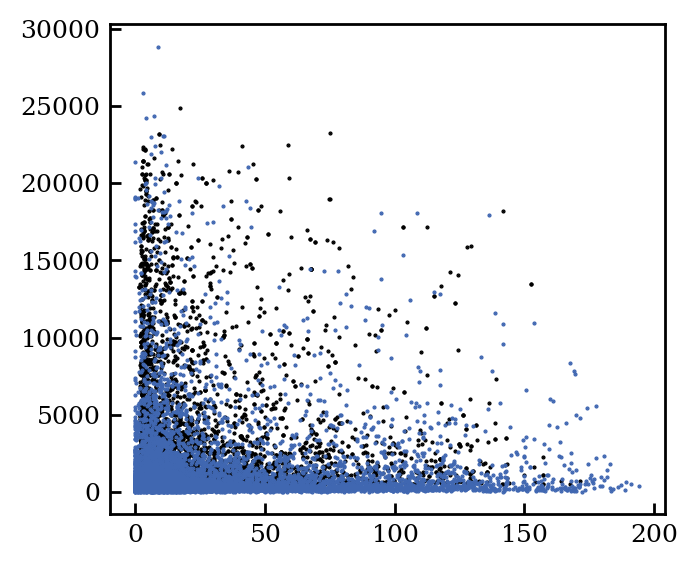

In [32]:
plt.scatter(ac_sample.T[0], ac_sample.T[1], s=1)
plt.scatter(d.cs1, d.cs2, s=1)

In [7]:
# Pattern 2. Simulate by myself
parameters = context.get_post_parameters()
key = apt.get_key()
key, (cs1, cs2, eff) = component.simulate(key, int(2e6), parameters)
mask = cs1 <= 100
mask &= cs1 >= 0
mask &= cs2 <= 1e4
mask &= cs2 >= 1e2
mask &= np.random.rand(len(cs1)) < eff
eff = eff[mask]

reference_sample = np.array([cs1[mask], cs2[mask]]).T
#reference_sample = np.array([cs1, cs2]).T

ac_template = get_file_path('ac_template_rn220_sr1.csv')
ac_sample = pd.read_csv(ac_template)
ac_sample = ac_sample[(ac_sample.cs1>0)&(ac_sample.cs1<100)&(ac_sample.cs2>1e2)&(ac_sample.cs2<1e4)]
#ac_template = get_file_path('AC_Rn220.pkl')
#ac_sample = pd.read_pickle(ac_template)
ac_rate = int(parameters['rn220_ac_rate'] / parameters['rn220_er_rate'] * len(reference_sample))
#ac_rate = int(0.0088237 * len(reference_sample))
index = np.random.choice(len(ac_sample), size=ac_rate)
ac_sample = ac_sample[['cs1', 'cs2']].to_numpy()[index]

reference_sample = np.concatenate([reference_sample, ac_sample])
reference_sample_weights = np.concatenate([eff, np.ones(len(ac_sample))])

pd.DataFrame({
    'cs1': reference_sample[:, 0],
    'cs2': reference_sample[:, 1],}).to_pickle('./toymc_rn220.pkl')

data_sample = pd.read_csv(apt.get_file_path('data_rn220_sr1.csv'))[['cs1', 'cs2']].to_numpy()
mask = data_sample[:, 0] <= 100
mask &= data_sample[:, 0] >= 0
mask &= data_sample[:, 1] <= 1e4
mask &= data_sample[:, 1] >= 1e2
data_sample = data_sample[mask]

TypeError: S1.simulate() missing 1 required positional argument: 'num_s1_pe'

In [5]:
parameters

{'w': np.float64(0.013749650633572542),
 'fano': 0.059,
 'gas_gain': 29.4,
 'drift_velocity': 0.0677,
 's2_threshold': 500.0,
 'field': 23.0,
 'nex_ni_ratio': np.float64(0.1791762029617344),
 'g1': np.float64(0.13664827730869247),
 'g2': np.float64(16.07348916385507),
 'p_dpe': np.float64(0.2144348514465236),
 'elife_sigma': np.float64(0.002994794556350308),
 's1_eff_n_hits_3f_sigma': np.float64(-0.0798362960704247),
 's1_cut_acc_sigma': np.float64(-0.1533004977461605),
 's2_cut_acc_sigma': np.float64(-0.6616609043119218),
 'hits_acceptance': np.float64(0.9340306519043685),
 'py0': np.float64(0.18768567987871748),
 'py1': np.float64(60.52594018916396),
 'py2': np.float64(-0.45914673490914004),
 'py3': np.float64(1.3450717192696569),
 'py4': np.float64(0.4761225328970582),
 'rf0': np.float64(0.028570674440450822),
 'rf1': np.float64(0.17483856550868887),
 'rn220_ac_rate': np.float64(36.418441224141915),
 'rn220_er_rate': np.float64(4713.385585132364)}

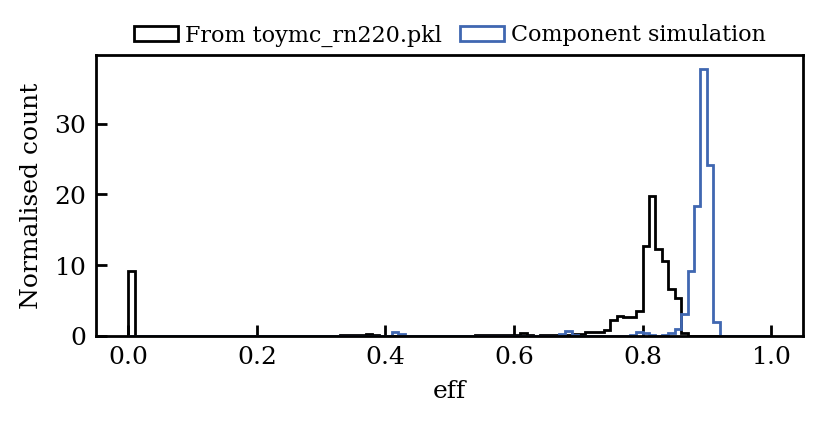

In [20]:
#key, (cs1, cs2, eff) = component.simulate(key, int(2e6), parameters)
plt.figure(figsize=(4,2))
plt.hist(df[df.eff<1.].eff.values, bins=100, range=(0,1), density=True, histtype='step', label='From toymc_rn220.pkl')
plt.hist(eff, bins=100, range=(0,1), density=True, histtype='step', label='Component simulation')
plt.legend()
plt.xlabel('eff')
plt.ylabel('Normalised count');

In [20]:
# check AC rate
print(len(ac_sample)/(len(reference_sample)-len(ac_sample)), parameters['rn220_ac_rate'] / parameters['rn220_er_rate'])

0.007726029585968696 0.007726599185735658


In [11]:
parameters

{'w': np.float64(0.013749650633572542),
 'fano': 0.059,
 'gas_gain': 29.4,
 'drift_velocity': 0.0677,
 's2_threshold': 100.0,
 'field': 23.0,
 'nex_ni_ratio': np.float64(0.1791762029617344),
 'g1': np.float64(0.13664827730869247),
 'g2': np.float64(16.07348916385507),
 'p_dpe': np.float64(0.2144348514465236),
 'elife_sigma': np.float64(0.002994794556350308),
 's1_eff_n_hits_3f_sigma': np.float64(-0.0798362960704247),
 's1_cut_acc_sigma': np.float64(-0.1533004977461605),
 's2_cut_acc_sigma': np.float64(-0.6616609043119218),
 'hits_acceptance': np.float64(0.9340306519043685),
 'py0': np.float64(0.18768567987871748),
 'py1': np.float64(60.52594018916396),
 'py2': np.float64(-0.45914673490914004),
 'py3': np.float64(1.3450717192696569),
 'py4': np.float64(0.4761225328970582),
 'rf0': np.float64(0.028570674440450822),
 'rf1': np.float64(0.17483856550868887),
 'rn220_ac_rate': np.float64(36.418441224141915),
 'rn220_er_rate': np.float64(4713.385585132364)}

In [40]:
d = pd.read_csv(apt.get_file_path('data_rn220_sr1.csv'))
len(d[(d.cs1>0)&(d.cs1<100)&(d.cs2>100)&(d.cs2<10000)])

4709

In [ ]:
with open('/home/ykaminaga/appletree/appletree/parameters/list_er_rn220_ar37.json', 'w') as f:
    json.dump(parameters, f, indent=2)

/opt/conda/envs/el7.2025.03.1/lib/python3.11/site-packages/GOFevaluation/utils.py:249: UserWarning: reference_sample contains ties, this might cause problems in the equiprobable binning.
  check_for_ties(reference_sample, dim=dim)


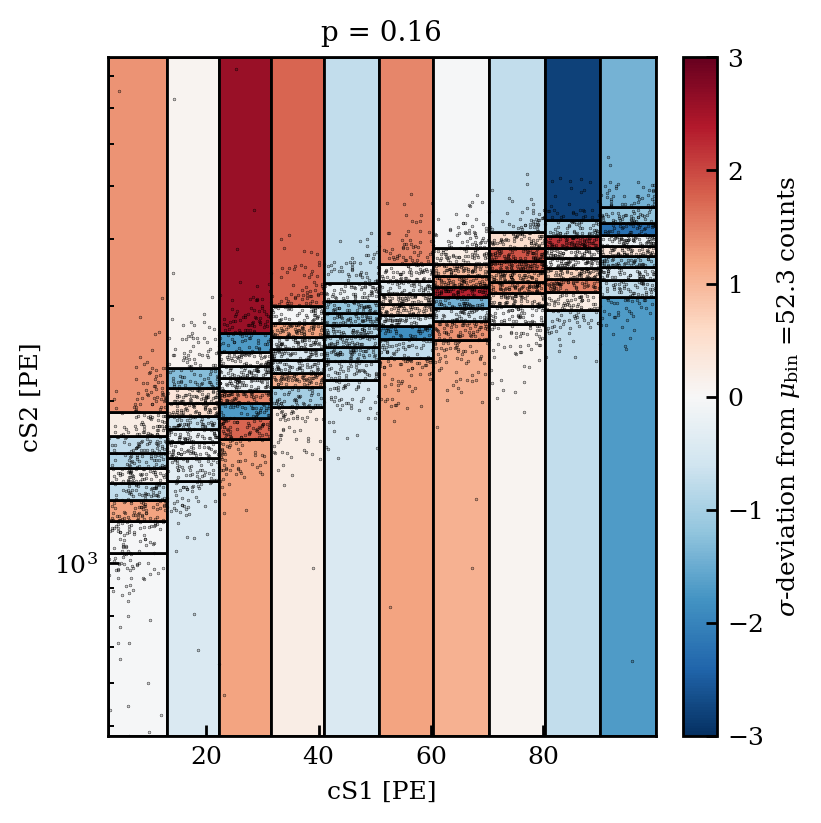

In [37]:
gof = BinnedPoissonChi2GOF.bin_equiprobable(
    data_sample,
    reference_sample,
    nevents_expected=len(data_sample),
    n_partitions=[10, 9],
    plot=True,
    #reference_sample_weights=reference_sample_weights,
    vmin=-3,
    vmax=+3,
)
plt.scatter(data_sample[:, 0],
            data_sample[:, 1],
            s=0.1, color='k')

plt.title(f"p = {gof.get_pvalue(n_mc=10000):.2f}")
plt.yscale('log')
plt.xlabel('cS1 [PE]')
plt.ylabel('cS2 [PE]')
plt.show()

In [32]:
mask = reference_sample[:, 0] <= 100
mask &= reference_sample[:, 0] >= 0
mask &= reference_sample[:, 1] <= 1e4
mask &= reference_sample[:, 1] >= 1e2

/opt/conda/envs/el7.2025.03.1/lib/python3.11/site-packages/GOFevaluation/utils.py:249: UserWarning: reference_sample contains ties, this might cause problems in the equiprobable binning.
  check_for_ties(reference_sample, dim=dim)


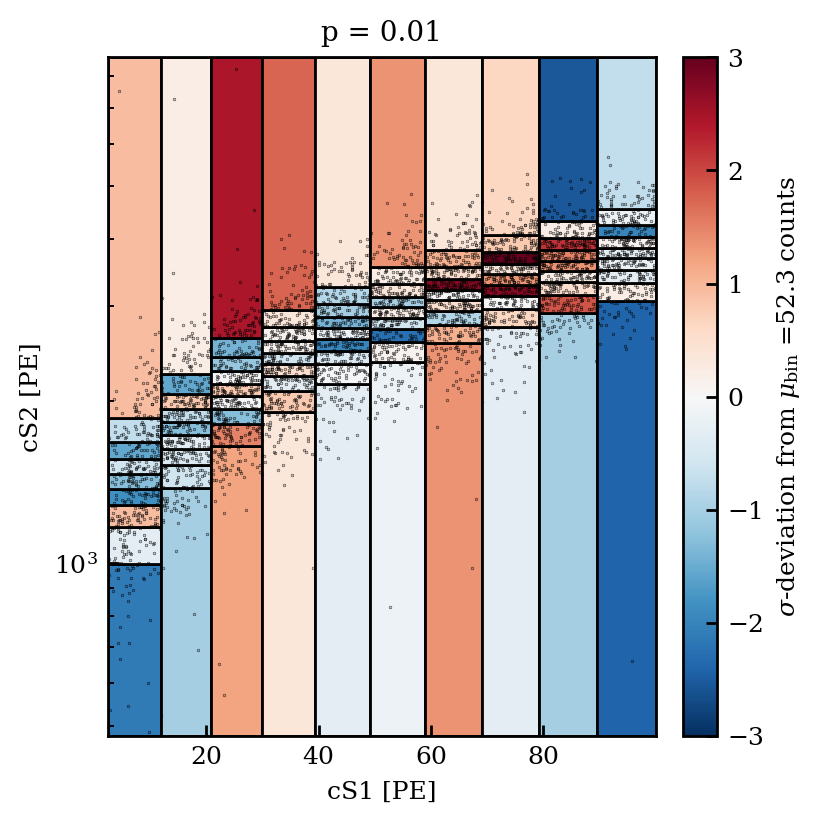

In [33]:
gof = BinnedPoissonChi2GOF.bin_equiprobable(
    data_sample,
    reference_sample[mask],
    nevents_expected=len(data_sample),
    n_partitions=[10, 9],
    plot=True,
    reference_sample_weights=reference_sample_weights[mask],
    vmin=-3,
    vmax=+3,
)
plt.scatter(data_sample[:, 0],
            data_sample[:, 1],
            s=0.1, color='k')

plt.title(f"p = {gof.get_pvalue(n_mc=10000):.2f}")
plt.yscale('log')
plt.xlabel('cS1 [PE]')
plt.ylabel('cS2 [PE]')
plt.show()

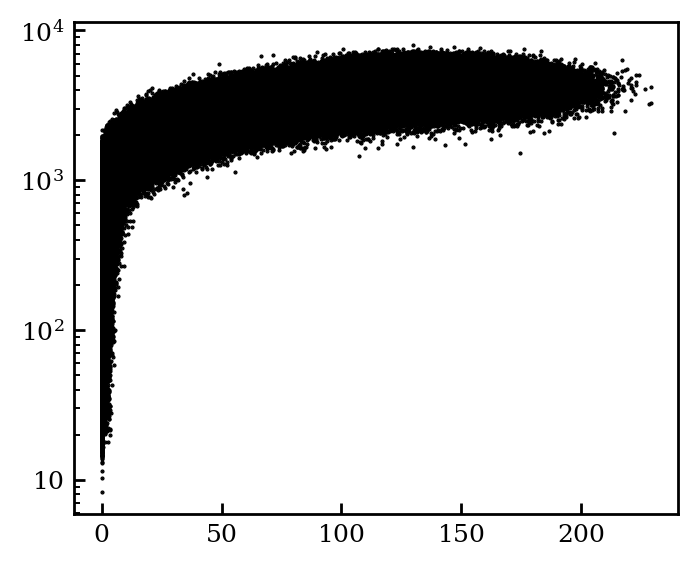

In [4]:
plt.scatter(cs1, cs2, s=1)
plt.yscale('log');

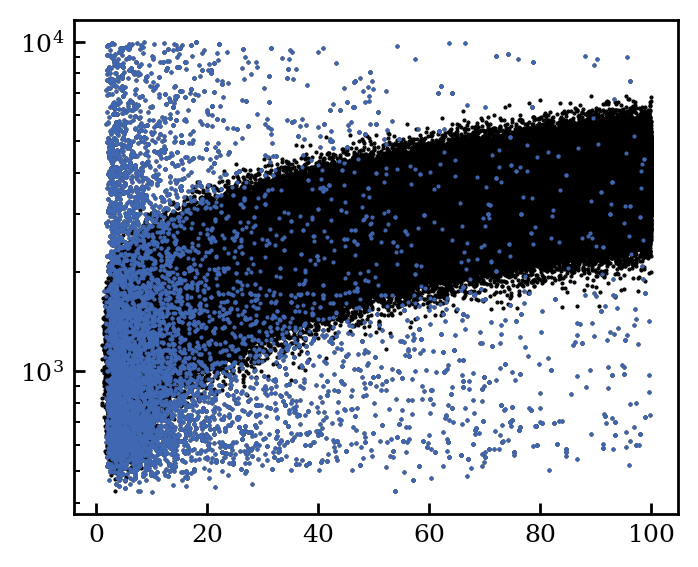

In [16]:
plt.scatter(reference_sample.T[0], reference_sample.T[1], s=1)
plt.scatter(ac_sample.T[0], ac_sample.T[1], s=1)
plt.yscale('log');

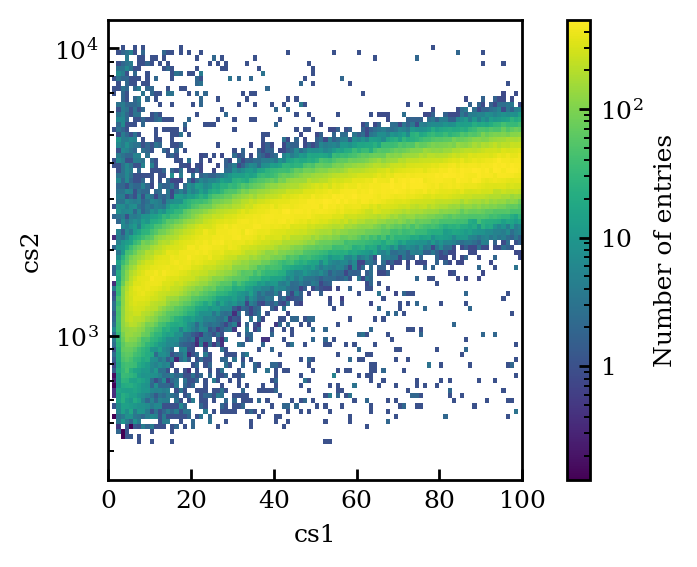

In [16]:
h_sr1, be = jnp.histogramdd(
    reference_sample,
    bins=(jnp.linspace(0, 100, 101), jnp.logspace(2.5, 4.1, 91)),
    weights=reference_sample_weights,
)

h_sr1 = mh.Histdd.from_histogram(np.array(h_sr1), be, axis_names=["cs1", "cs2"])
h_sr1.plot(norm=LogNorm())
plt.yscale("log")
plt.show()

/tmp/ipykernel_352459/2083841380.py:1: RuntimeWarning: divide by zero encountered in divide
  h = mh.Histdd.from_histogram(np.where((np.array(h_sr1)!=0)&(np.array(h)==0),1e-9,np.array(h)/np.array(h_sr1)),
/tmp/ipykernel_352459/2083841380.py:1: RuntimeWarning: invalid value encountered in divide
  h = mh.Histdd.from_histogram(np.where((np.array(h_sr1)!=0)&(np.array(h)==0),1e-9,np.array(h)/np.array(h_sr1)),


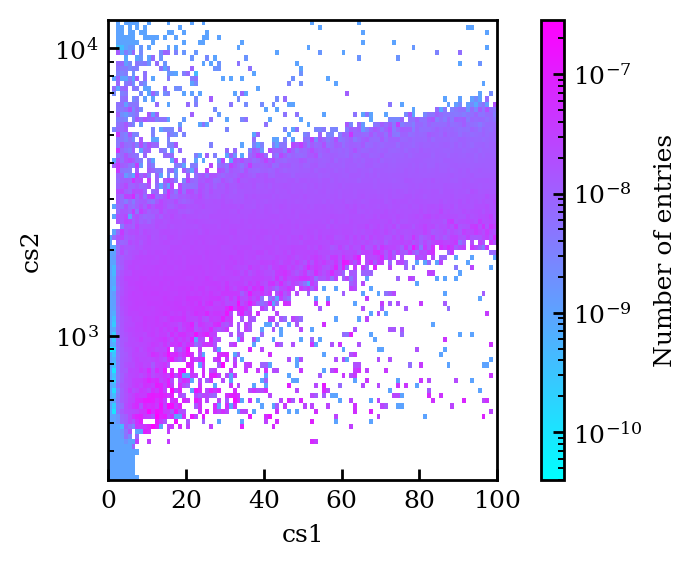

In [30]:
h = mh.Histdd.from_histogram(np.where((np.array(h_sr1)!=0)&(np.array(h)==0),1e-9,np.array(h)/np.array(h_sr1)), 
                             be, axis_names=["cs1", "cs2"])
h.plot(norm=LogNorm(), cmap='cool')
plt.yscale("log")
plt.show()

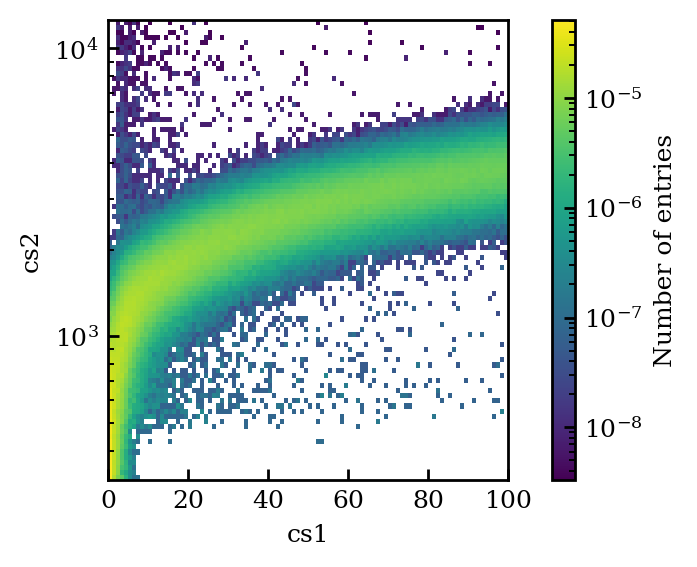

In [18]:
h, be = jnp.histogramdd(
    reference_sample,
    bins=(jnp.linspace(0, 100, 101), jnp.logspace(2.5, 4.1, 91)),
    #weights=reference_sample_weights,
    density=True
)

h = mh.Histdd.from_histogram(np.array(h), be, axis_names=["cs1", "cs2"])
h.plot(norm=LogNorm())
plt.yscale("log")
plt.show()

/opt/conda/envs/el7.2025.03.1/lib/python3.11/site-packages/GOFevaluation/utils.py:249: UserWarning: reference_sample contains ties, this might cause problems in the equiprobable binning.
  check_for_ties(reference_sample, dim=dim)


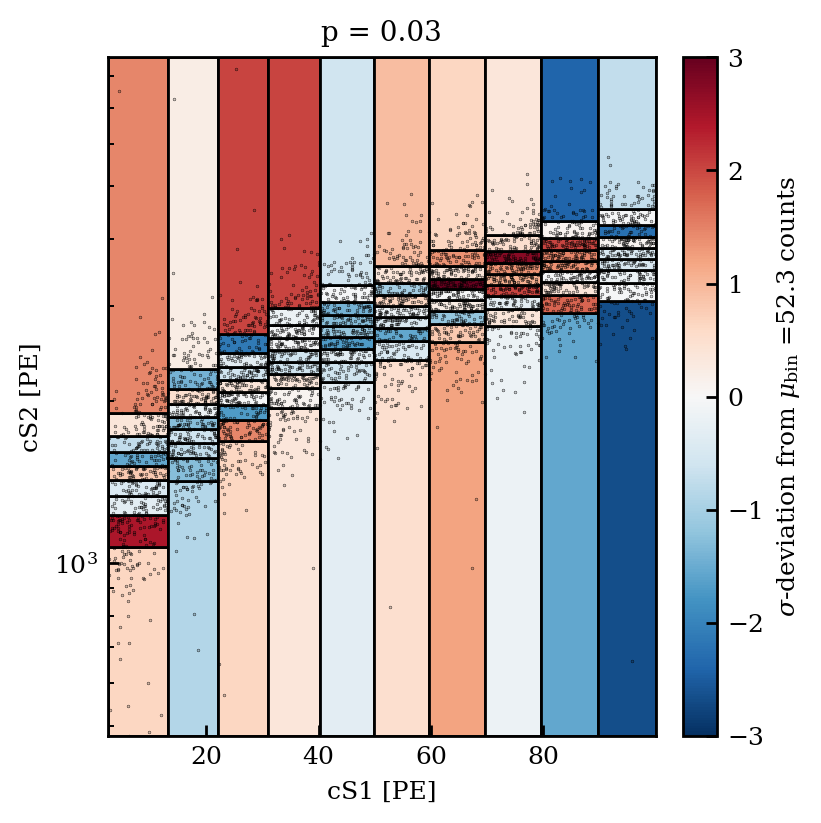

In [6]:
# Simulation
gof = BinnedPoissonChi2GOF.bin_equiprobable(
    data_sample,
    reference_sample,
    nevents_expected=len(data_sample),
    n_partitions=[10, 9],
    plot=True,
    reference_sample_weights=reference_sample_weights,
    vmin=-3,
    vmax=+3,
)
plt.scatter(data_sample[:, 0],
            data_sample[:, 1],
            s=0.1, color='k')

plt.title(f"p = {gof.get_pvalue(n_mc=10000):.2f}")
plt.yscale('log')
plt.xlabel('cS1 [PE]')
plt.ylabel('cS2 [PE]')
plt.show()

/home/ykaminaga/appletree/appletree/plot.py:144: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


(<Figure size 2000x3300 with 21 Axes>,
 [<XENONAxes: ylabel='elife_sigma'>,
  <XENONAxes: ylabel='g1'>,
  <XENONAxes: ylabel='g2'>,
  <XENONAxes: ylabel='hits_acceptance'>,
  <XENONAxes: ylabel='nex_ni_ratio'>,
  <XENONAxes: ylabel='p_dpe'>,
  <XENONAxes: ylabel='py0'>,
  <XENONAxes: ylabel='py1'>,
  <XENONAxes: ylabel='py2'>,
  <XENONAxes: ylabel='py3'>,
  <XENONAxes: ylabel='py4'>,
  <XENONAxes: ylabel='rf0'>,
  <XENONAxes: ylabel='rf1'>,
  <XENONAxes: ylabel='rn220_ac_rate'>,
  <XENONAxes: ylabel='rn220_er_rate'>,
  <XENONAxes: ylabel='s1_cut_acc_sigma'>,
  <XENONAxes: ylabel='s1_eff_n_hits_3f_sigma'>,
  <XENONAxes: ylabel='s2_cut_acc_sigma'>,
  <XENONAxes: ylabel='w'>,
  <XENONAxes: xlabel='Number of iterations', ylabel='log posterior'>,
  <XENONAxes: xlabel='Number of iterations', ylabel='log prior'>])

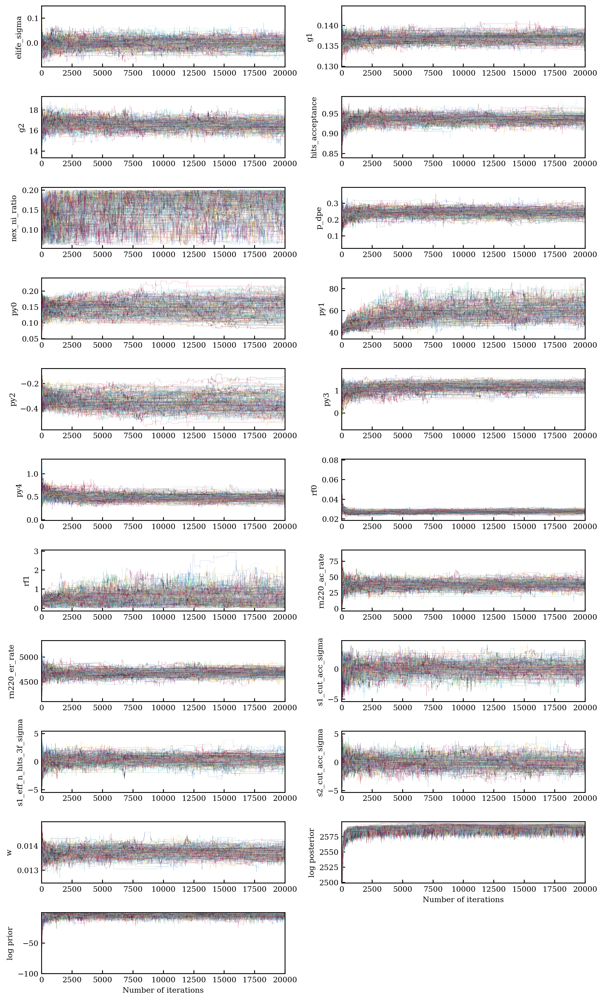

In [19]:
plotter = apt.Plotter(filename, discard=0)
plotter.plot_burn_in()
#plt.savefig('./fig/burn_in.png')

/home/ykaminaga/appletree/appletree/plot.py:198: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


(<Figure size 2000x4000 with 19 Axes>,
 [<XENONAxes: xlabel='elife_sigma', ylabel='PDF'>,
  <XENONAxes: xlabel='g1', ylabel='PDF'>,
  <XENONAxes: xlabel='g2', ylabel='PDF'>,
  <XENONAxes: xlabel='hits_acceptance', ylabel='PDF'>,
  <XENONAxes: xlabel='nex_ni_ratio', ylabel='PDF'>,
  <XENONAxes: xlabel='p_dpe', ylabel='PDF'>,
  <XENONAxes: xlabel='py0', ylabel='PDF'>,
  <XENONAxes: xlabel='py1', ylabel='PDF'>,
  <XENONAxes: xlabel='py2', ylabel='PDF'>,
  <XENONAxes: xlabel='py3', ylabel='PDF'>,
  <XENONAxes: xlabel='py4', ylabel='PDF'>,
  <XENONAxes: xlabel='rf0', ylabel='PDF'>,
  <XENONAxes: xlabel='rf1', ylabel='PDF'>,
  <XENONAxes: xlabel='rn220_ac_rate', ylabel='PDF'>,
  <XENONAxes: xlabel='rn220_er_rate', ylabel='PDF'>,
  <XENONAxes: xlabel='s1_cut_acc_sigma', ylabel='PDF'>,
  <XENONAxes: xlabel='s1_eff_n_hits_3f_sigma', ylabel='PDF'>,
  <XENONAxes: xlabel='s2_cut_acc_sigma', ylabel='PDF'>,
  <XENONAxes: xlabel='w', ylabel='PDF'>])

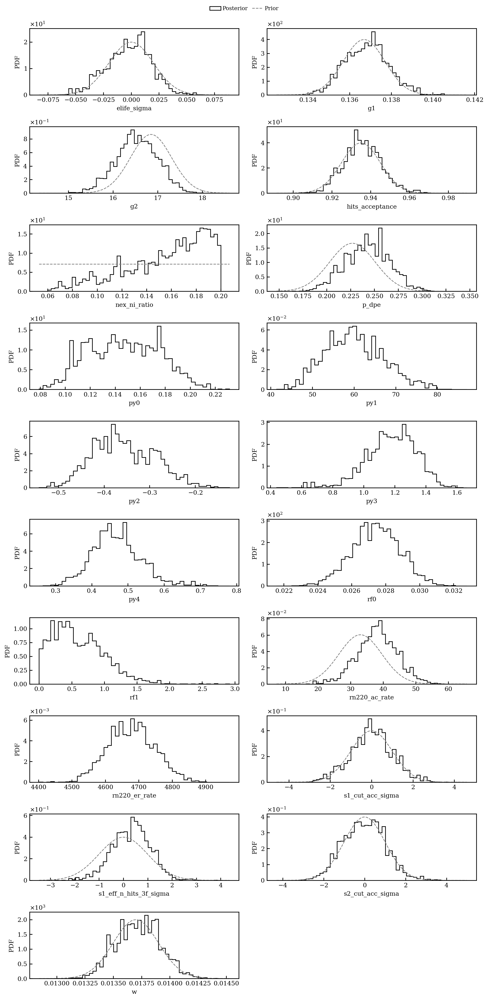

In [20]:
plotter = apt.Plotter(filename, discard=10000)
plotter.plot_marginal_posterior()
#plt.savefig('./fig/marginal.png')

/home/ykaminaga/appletree/appletree/plot.py:144: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
/home/ykaminaga/appletree/appletree/plot.py:198: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
/opt/conda/envs/el7.2025.03.1/lib/python3.11/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(
/home/ykaminaga/appletree/appletree/plot.py:283: RuntimeWarning: invalid value encountered in divide
  acf /= acf[0]
/home/ykaminaga/appletree/appletree/plot.py:339: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7f1bf4301510>>
Traceback (most recent call last):
  File "/opt/conda/envs/el7.2025.03.1/lib/python3.11/site-packages/ipykernel/ipkernel.py", line

Error in callback <function _draw_all_if_interactive at 0x7f1b27fc1c60> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

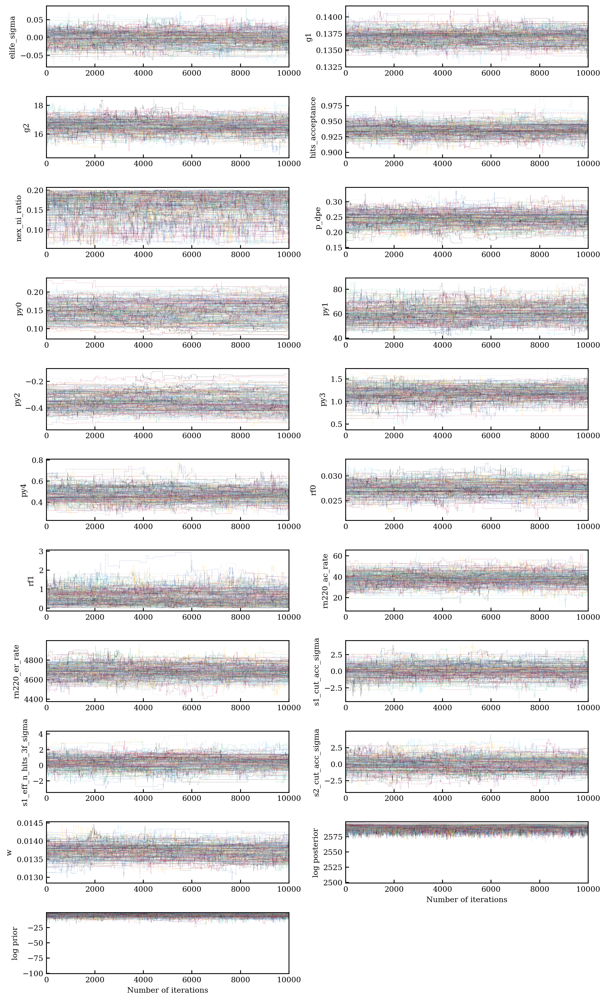

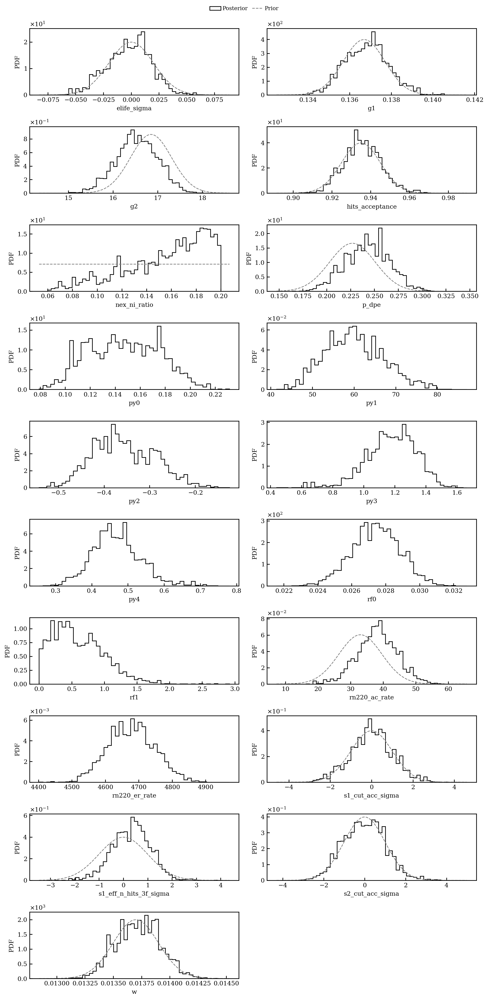

In [ ]:
plotter.make_all_plots()

### SR1 ER band fitting by Zihao

In [ ]:
import h5py
data = h5py.File("/stor0/kaminaga/data/fit_result/zihao/sr1_rn220_fitting.h5")
data['mcmc'].keys()

In [19]:
print(data['mcmc'].attrs["nwalkers"])
print(data['mcmc'].attrs["batch_size"])
print(data['mcmc'].attrs["instruct"])

200
1000000
{
    "backend_h5": "sr1_rn220_fitting.h5",
    "configs": {
        "elife": "elife_bkg_sr1.json",
        "event_building_eff": "anti_correlation_eff_rn220_sr1.json",
        "posrec_reso": "posrec_reso_sr0.json",
        "s1_bias_3f": "3fold_s1_bias_rn220_sr1.json",
        "s1_correction": "s1_correction_sr1.json",
        "s1_cut_acc": [
            "s1_cut_acc_median_rn220_sr1.json",
            "s1_cut_acc_lower_rn220_sr1.json",
            "s1_cut_acc_upper_rn220_sr1.json"
        ],
        "s1_eff_n_hits_3f": [
            "3fold_recon_eff_n_hits_median_sr0.json",
            "3fold_recon_eff_n_hits_lower_sr0.json",
            "3fold_recon_eff_n_hits_upper_sr0.json"
        ],
        "s1_lce": "s1_correction_sr1.json",
        "s1_smear_3f": "3fold_s1_smearing_rn220_sr1.json",
        "s2_bias": "s2_bias_rn220_sr1.json",
        "s2_correction": "s2_correction_sr1.json",
        "s2_cut_acc": [
            "s2_cut_acc_median_rn220_sr1.json",
            "s2_cut_

In [ ]:
import emcee
import copy
import multihist as mh

class YieldModel():
    def __init__(self, context, discard=0):
        self.logp = context.sampler.get_log_prob(flat=True, discard=discard)
        self.chain = context.sampler.get_chain(flat=True, discard=discard)
    
    def yields(self, energy, w, nex_ni_ratio, py0, py1, py2, py3, py4, field, **kwargs):
        ni = energy / w * 1 / (1 + nex_ni_ratio)
        zeta = 1 / 4 * py0 * np.exp(-energy / py1) * field ** py2
        recomb = 1 / (1 + np.exp(-(energy - py3) / py4)) * (1 - np.log(1 + ni * zeta) / ni / zeta)
        qy = ni * (1 - recomb) / energy
        ly = 1 / w - qy
        return ly, qy
    
    def get_parameters(self):
        """Get parameters correspondes to max posterior."""
        ind = np.random.randint(len(self.logp))
        _parameters = self.chain[ind]
        _parameters = emcee.ensemble.ndarray_to_list_of_dicts(
            np.atleast_2d(_parameters),
            context.sampler.parameter_names,
        )[0]
        parameters = copy.deepcopy(context.par_manager.get_all_parameter())
        parameters.update(_parameters)
        return parameters
    
    def __call__(self, energy, size=0):
        E, Ly, Qy = [], [], []
        for _ in range(size):
            ly, qy = self.yields(energy, **self.get_parameters())
            E.append(energy)
            Ly.append(ly)
            Qy.append(qy)
        E = np.concatenate(E)
        Ly = np.concatenate(Ly)
        Qy = np.concatenate(Qy)
        return E, Ly, Qy

In [ ]:
y = YieldModel(context, discard=5000)
energy, ly, qy = y(np.geomspace(0.05, 31, 100), size=10000)
df = pd.DataFrame({'energy': energy, 'ly': ly, 'qy': qy})

yields = df.groupby('energy').agg(
    ly_median=pd.NamedAgg(column="ly", aggfunc=lambda x: np.percentile(x, sps.norm.cdf(0) * 100)),
    ly_lower=pd.NamedAgg(column="ly", aggfunc=lambda x: np.percentile(x, sps.norm.cdf(-1) * 100)),
    ly_upper=pd.NamedAgg(column="ly", aggfunc=lambda x: np.percentile(x, sps.norm.cdf(1) * 100)),
    qy_median=pd.NamedAgg(column="qy", aggfunc=lambda x: np.percentile(x, sps.norm.cdf(0) * 100)),
    qy_lower=pd.NamedAgg(column="qy", aggfunc=lambda x: np.percentile(x, sps.norm.cdf(-1) * 100)),
    qy_upper=pd.NamedAgg(column="qy", aggfunc=lambda x: np.percentile(x, sps.norm.cdf(1) * 100)),
)

# G1 = {'sr0': 0.1515, 'sr1': 0.1367, 'sr1a': 0.1367, 'sr1b': 0.1367}
# G2 = {'sr0': 16.45, 'sr1': 16.85, 'sr1a': 16.85, 'sr1b': 16.85}

Text(0, 0.5, 'Photon yield [ph/keV]')

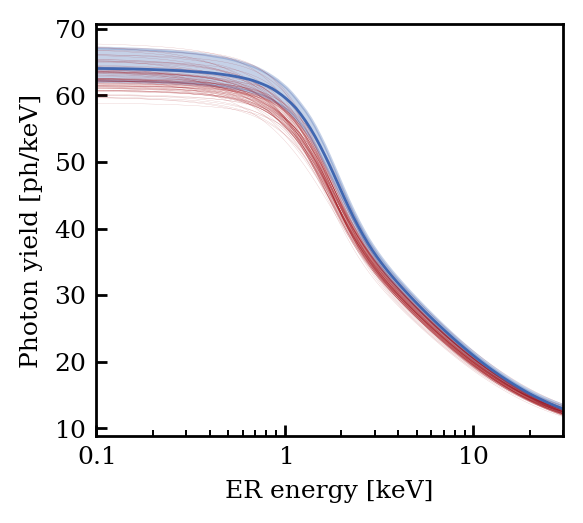

In [19]:
import json
with open('/home/zihaoxu/Paper_Plots/SR0_Analysis_Paper_II/bbf_emission_model/data_er/er_emission_model.json', 'r') as file:
    data = json.load(file)

plt.figure(figsize=(2.8, 2.5))

for i in range(100):
    df_slice = df.iloc[i * 100:i * 100 + 100]
    plt.plot(df_slice['energy'], df_slice['qy'], color=xps.colors['darkred'], lw=0.1, alpha=0.3)


l1, = plt.plot(data['energy'], data['Qy']['median'], color=xps.colors['xenon_blue'])
b1 = plt.fill_between(data['energy'], data['Qy']['lower'], data['Qy']['upper'], color=xps.colors['xenon_blue'], alpha=0.3)

plt.xscale('log')
plt.xlim(0.1, 30)
plt.xlabel('ER energy [keV]')
plt.ylabel('Photon yield [ph/keV]')

In [ ]:
import json
with open('/home/zihaoxu/Paper_Plots/SR0_Analysis_Paper_II/bbf_emission_model/data_er/er_emission_model.json', 'r') as file:
    data = json.load(file)

plt.figure(figsize=(2.8, 2.5))
l1, = plt.plot(data['energy'], data['Ly']['median'], color=xps.colors['xenon_blue'])
b1 = plt.fill_between(data['energy'], data['Ly']['lower'], data['Ly']['upper'], color=xps.colors['xenon_blue'], alpha=0.3)
l2, = plt.plot(yields.index, yields['ly_median'], color=xps.colors['darkred'])
b2 = plt.fill_between(yields.index, yields['ly_lower'], yields['ly_upper'], color=xps.colors['darkred'], alpha=0.3)

plt.legend([(l1, b1), (l2, b2)],
           [r'SR0 ${}^{220}$Rn+${}^{37}$Ar', r'SR1 ${}^{220}$Rn'])
plt.xscale('log')
plt.xlim(0.1, 30)
plt.xlabel('ER energy [keV]')
plt.ylabel('Photon yield [ph/keV]')
# plt.ylabel('g1 x Photon yield [PE/keV]')
# plt.savefig('./fig/ly.png')
plt.show()

In [ ]:
import json
with open('/home/zihaoxu/Paper_Plots/SR0_Analysis_Paper_II/bbf_emission_model/data_er/er_emission_model.json', 'r') as file:
    data = json.load(file)

plt.figure(figsize=(2.8, 2.5))
l1, = plt.plot(data['energy'], data['Qy']['median'], color=xps.colors['xenon_blue'])
b1 = plt.fill_between(data['energy'], data['Qy']['lower'], data['Qy']['upper'], color=xps.colors['xenon_blue'], alpha=0.3)
l2, = plt.plot(yields.index, yields['qy_median'], color=xps.colors['darkred'])
b2 = plt.fill_between(yields.index, yields['qy_lower'], yields['qy_upper'], color=xps.colors['darkred'], alpha=0.3)

plt.legend([(l1, b1), (l2, b2)],
           [r'SR0 ${}^{220}$Rn+${}^{37}$Ar', r'SR1 ${}^{220}$Rn'])
plt.xscale('log')
plt.xlim(0.1, 30)
plt.xlabel('ER energy [keV]')
# plt.ylabel('g2 x Charge yield [PE/keV]')
plt.ylabel('Charge yield [e$^-$/keV]')
# plt.savefig('./fig/qy.png')
plt.show()

In [ ]:
from matplotlib import colors

# Define cmap
original_cmap = plt.cm.PiYG
colors_list = original_cmap(np.clip(np.linspace(0, 1, 256)**0.3, 0, 0.6))
colors_list = np.clip(colors_list, 0, 1)
cmap = colors.ListedColormap(colors_list)

def slice_mask(x, lower, upper):
    return (x >= lower) & (x < upper)

p_values = []
fig, axes = plt.subplots(2, 5, figsize=(10, 4))
axes = np.ravel(axes)

for i, ax in tqdm(enumerate(axes)):
    lower = i * 10
    upper = lower + 10

    mask = slice_mask(reference_sample[:, 0], lower, upper)
    cs2_ref = reference_sample[mask][:, 1]
    ax.plot(np.sort(cs2_ref), np.linspace(0, 1, len(cs2_ref)), color=xps.colors['xenon_blue'], label=r'SR1 best-fit ER model')

    mask = slice_mask(data_sample[:, 0], lower, upper)
    cs2_data = data_sample[mask][:, 1]
    ax.plot(np.sort(cs2_data), np.linspace(0, 1, len(cs2_data)), color=xps.colors['darkred'], label=r'SR1 $^{220}$Rn data')

    downsample_mask = np.random.choice([True, False], size=len(cs2_ref), p=[0.05, 0.95])
    gof = ADTestTwoSampleGOF(cs2_data, cs2_ref[downsample_mask])
    p = gof.get_pvalue(1000)
    # p = 0.1
    p_values.append(p)
    ax.set_facecolor(cmap(p))

    ax.axhline(1, color='k', ls='--')
    ax.set_title(fr'{lower} < cS1 / PE < {upper}', fontsize=9)

    ax.set_xscale('log')
    ax.set_xlim(5e2, 1e4)
    ax.set_ylim(0, 1.1)
    ax.set_yticks([0, 0.5, 1])
    if not i % 5:
        ax.set_ylabel('CDF')
    if i < 5:
        ax.set_xticklabels([])
    else:
        ax.set_xlabel('cS2 [PE]')

handles, labels = ax.get_legend_handles_labels()
fig.legend(loc="lower center", handles=handles, labels=labels, bbox_to_anchor=(0.5, 1.0))

sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, label='Anderson–Darling test p-value', ax=axes.ravel().tolist(), pad=0.03, aspect=50)

plt.savefig('./fig/cs1_slice_ad_test.png', bbox_inches='tight')
# plt.savefig('./fig/cs1_slice_ad_test.svg', bbox_inches='tight')
plt.show()

In [ ]:
p_values = np.array(p_values)
plt.errorbar(np.arange(5, 105, 10), p_values, yerr=np.sqrt(p_values * (1-p_values) / 1000), xerr=5, ls='', capsize=0)
plt.axhline(1, ls='--', color='k')
plt.xlim(0, 100)
plt.ylim(5e-2, 2)
# plt.ylim(0, 1.1)
plt.yscale('log')
plt.xlabel('cS1 [PE]')
plt.ylabel('Anderson–Darling test p-value')
plt.savefig('./fig/cs1_slice_ad_test_p_value.png')
# plt.savefig('./fig/cs1_slice_ad_test_p_value.svg')
plt.show()